In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from corner import corner

# single run plots

In [2]:
rundir = './'

## check out the data

In [3]:
datadir = os.path.join(rundir,'data')
os.listdir(datadir)

['coarse_Qeff.dat',
 'dwt_data.dat',
 'instrument_noise_model.dat',
 'final_foreground_noise_model.dat',
 'final_sgwb_noise_model.dat',
 'final_full_noise_model.dat',
 'current_instrument_noise_model.dat',
 'scaleogram_data.dat',
 'dft_data.dat',
 'foreground_noise_model.dat',
 'coarse_Pxx.dat',
 'final_instrument_noise_model.dat',
 'full_noise_model.dat',
 'current_sgwb_noise_model.dat',
 'whitened_data.dat',
 'power_data.dat',
 'power_noise_reconstruction.dat',
 'sgwb_noise_model.dat',
 'current_foreground_noise_model.dat']

In [4]:
scaleogram_data = np.loadtxt(os.path.join(datadir,'scaleogram_data.dat'))
full_noise      = np.loadtxt(os.path.join(datadir,'full_noise_model.dat'))
dwt_data        = np.loadtxt(os.path.join(datadir,'dwt_data.dat'))

In [5]:
# cols are t, f, |X|^2, |Y|^2, |Z|^2

In [6]:
full_noise.shape

(5664, 8)

In [7]:
dwt_data.shape

(957216, 5)

In [8]:
dwt_data[-1,0]

np.float64(62292500.0)

In [18]:
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
from matplotlib import colors
%matplotlib inline

def get_Nt_Nf(datafile_arr):
    # cols are t, f, ...
    Nf = np.unique(datafile_arr[:,1]).shape[0]
    Nt = np.unique(datafile_arr[:,0]).shape[0]
    assert Nt*Nf == datafile_arr.shape[0]
    return Nt,Nf

def wavelet_specgram(t, f, pz, Nt = 512, clip = 0, lognorm=False, cmap='bwr', cx_norm='abs', logf=False,savefname=None):
    Nf = t.shape[0] // Nt
    if t.shape[0] != Nt*Nf or f.shape[0] != Nt*Nf:
        print("Nt or Nf is wrong")
    z = pz.copy()
    if lognorm:
        z = np.ma.masked_less_equal(z.astype(float), 0)
        lo, hi = np.nanpercentile(z.compressed(), [clip, 100-clip])
        norm = colors.AsinhNorm(vmin=lo, vmax = hi, clip=True)
    else:
        lo, hi = np.nanpercentile(z, [clip, 100-clip])
        norm = colors.Normalize(vmin=lo, vmax = hi, clip=True)
    #plt.imshow(z.reshape((Nf,Nt)),cmap=cmap,norm=norm,aspect=9/16*Nt/Nf,interpolation='none')
    fig, ax = plt.subplots()
    shading = 'auto'
    tp = t[::Nf]
    fp = f[:Nf]
    if Nt == 1:
        tp = np.array([tp[0], dwt_data[-1,0]])
        fp = np.hstack([fp, fp[-1] + (fp[1]-fp[0])])
    m = ax.pcolormesh(tp, fp, z.reshape((Nt,Nf)).T, cmap=cmap, norm=norm, shading=shading, snap=True, rasterized=True)
    if logf:
        ax.set_yscale('log')
    fig.colorbar(m,ax=ax)
    plt.xlabel('t')
    plt.ylabel('f')
    if savefname is not None:
        plt.savefig(savefname)
    plt.show()
    

In [10]:
Nt,Nf = get_Nt_Nf(full_noise)

In [11]:
full_noise[:Nf,1]

array([0.00039063, 0.00045573, 0.00052083, 0.00058594, 0.00065104,
       0.00071615, 0.00078125, 0.00084635, 0.00091146, 0.00097656,
       0.00104167, 0.00110677, 0.00117188, 0.00123698, 0.00130208,
       0.00136719, 0.00143229, 0.0014974 , 0.0015625 , 0.0016276 ,
       0.00169271, 0.00175781, 0.00182292, 0.00188802, 0.00195313,
       0.00201823, 0.00208333, 0.00214844, 0.00221354, 0.00227865,
       0.00234375, 0.00240885, 0.00247396, 0.00253906, 0.00260417,
       0.00266927, 0.00273438, 0.00279948, 0.00286458, 0.00292969,
       0.00299479, 0.0030599 , 0.003125  , 0.0031901 , 0.00325521,
       0.00332031, 0.00338542, 0.00345052, 0.00351563, 0.00358073,
       0.00364583, 0.00371094, 0.00377604, 0.00384115, 0.00390625,
       0.00397135, 0.00403646, 0.00410156, 0.00416667, 0.00423177,
       0.00429688, 0.00436198, 0.00442708, 0.00449219, 0.00455729,
       0.0046224 , 0.0046875 , 0.0047526 , 0.00481771, 0.00488281,
       0.00494792, 0.00501302, 0.00507813, 0.00514323, 0.00520

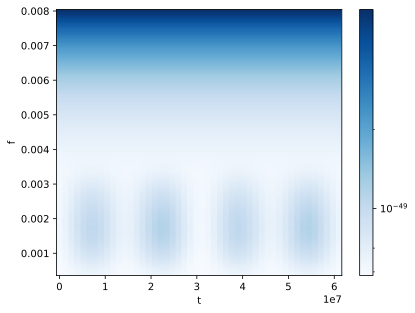

In [20]:
wavelet_specgram(full_noise[:,0], full_noise[:,1], full_noise[:,2], Nt=Nt, lognorm=True, clip = 0, cmap='Blues', logf=False, savefname='wpsd.png')

/var/folders/h6/rzz7tfhd0v76qyg_gtclph4c0000gp/T/ipykernel_69970/1032073873.py:33: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  m = ax.pcolormesh(tp, fp, z.reshape((Nt,Nf)).T, cmap=cmap, norm=norm, shading=shading, snap=True, rasterized=True)


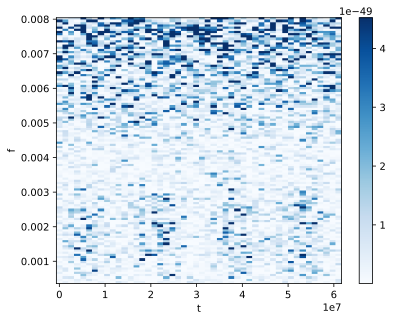

In [13]:
wavelet_specgram(scaleogram_data[:,0],
                 scaleogram_data[:,1],
                 scaleogram_data[:,2],
                 Nt=Nt,
                 lognorm=False,
                cmap = 'Blues',
                clip = 5)

In [14]:
# gaussianity test of generated data
# fudge_factor = 3 # implemented in code
counts,bins,_ = plt.hist(dwt_data[:,4] / np.sqrt(full_noise[:,4]), density=True, bins=100)
x = np.linspace(bins[0],bins[-1],100)
plt.plot(x, np.exp(-x**2 / 2)*np.max(counts), color='k', linestyle = '--')
plt.yscale('log')

ValueError: operands could not be broadcast together with shapes (957216,) (5664,) 

In [16]:
  whitened = dwt_data[:,4] / np.sqrt(full_noise[:,4])
  print(f"Whitened variance: {np.var(whitened):.4f}")

ValueError: operands could not be broadcast together with shapes (478608,) (2832,) 

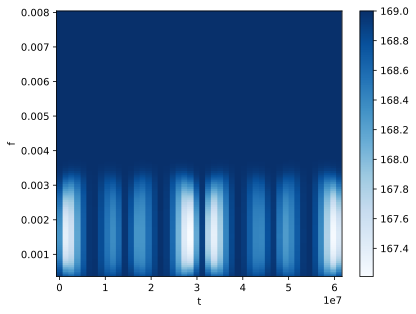

In [19]:
qeff_fname = os.path.join(datadir, "coarse_Qeff.dat")
if os.path.exists(qeff_fname):
    qeff = np.loadtxt(qeff_fname)
    Nt,Nf = get_Nt_Nf(qeff)
    wavelet_specgram(qeff[:,0],
                     qeff[:,1],
                     qeff[:,2],
                     Nt=Nt,
                     lognorm=False,
                    cmap = 'Blues',
                    clip = 0,
                    savefname="./qeff.png")

## chains

In [48]:
chaindir = os.path.join(rundir, 'chains')

In [49]:
os.listdir(chaindir)

['temperature_chain.dat',
 'noise_chain.dat',
 'sgwb_chain.dat',
 'model_chain.dat.0',
 'foreground_chain.dat.0',
 'parameter_chain.dat.0',
 'log_likelihood_chain.dat',
 'noise_chain.dat.0',
 'foreground_chain.dat']

In [50]:
sgwb = None
if os.path.exists(os.path.join(chaindir, 'sgwb_chain.dat')):
    sgwb = np.loadtxt(os.path.join(chaindir, 'sgwb_chain.dat'))
galx = None
if os.path.exists(os.path.join(chaindir, 'foreground_chain.dat')):
    galx = np.loadtxt(os.path.join(chaindir, 'foreground_chain.dat'))
inst = np.loadtxt(os.path.join(chaindir, 'noise_chain.dat'))

In [51]:
sgwb.shape

(2000, 4)

In [52]:
inst.shape

(2000, 14)

In [53]:
galx.shape

(2000, 7)

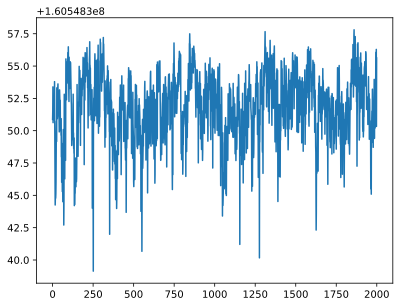

In [54]:
plt.plot(inst[:,1])

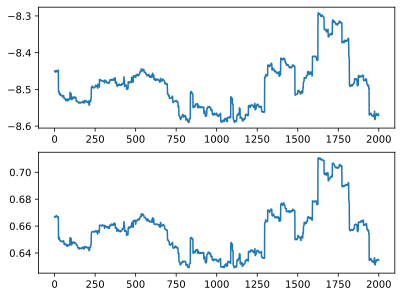

In [55]:
# sgwb trace
fig, ax = plt.subplots(2,1)
ax[0].plot(sgwb[0:,2])
ax[1].plot(sgwb[0:,3])

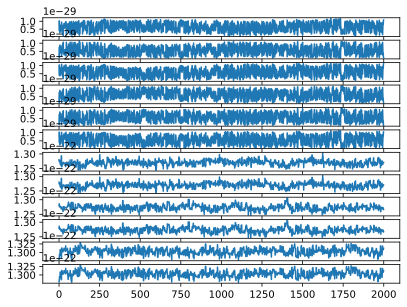

In [56]:
# inst trace
burn = 0
fig, ax = plt.subplots(12,1)
for i in range(12):
    ax[i].plot(inst[burn:,i+2])

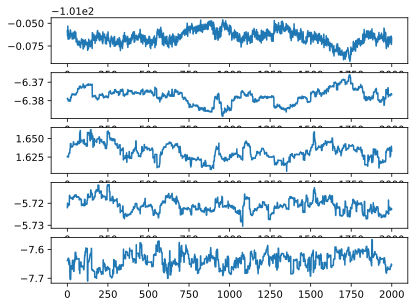

In [57]:
burn = 0
fig, ax = plt.subplots(5,1)
for i in range(5):
    ax[i].plot(galx[burn:,i+2])

In [58]:
from corner import corner

In [59]:
burn = 0
sgwb_chain = np.array(
    [
        sgwb[burn:,2], # logA
        sgwb[burn:,3], # alpha
    ]).T
sgwb_labels = [r'$\log A_p$', r'$\alpha$']

In [60]:
inst_chain = np.array(
    [
        inst[burn:,i+2]
        for i in range(12)
    ]).T
inst_labels = [r'$\log S_{\mathrm{acc},12}$',
r'$\log S_{\mathrm{acc},21}$',
r'$\log S_{\mathrm{acc},13}$',
r'$\log S_{\mathrm{acc},31}$',
r'$\log S_{\mathrm{acc},23}$', 
r'$\log S_{\mathrm{acc},32}$', 
r'$\log S_{\mathrm{oms},12}$', 
r'$\log S_{\mathrm{oms},21}$', 
r'$\log S_{\mathrm{oms},13}$', 
r'$\log S_{\mathrm{oms},31}$', 
r'$\log S_{\mathrm{oms},23}$', 
r'$\log S_{\mathrm{oms},32}$']

In [61]:
galx_chain = np.array(
    [
        galx[burn:,i+2]
        for i in range(5)
    ]).T
galx_labels = [r'$\log A$', r'$f_1$', r'$\alpha$', r'$f_k$', r'$f_2$']

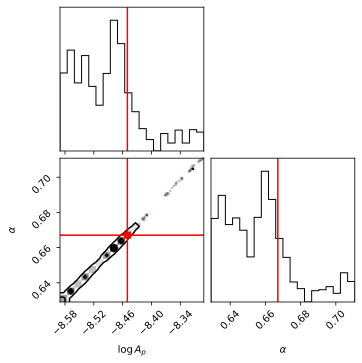

In [62]:
truths = sgwb[0,2:]
corner(sgwb_chain, labels = sgwb_labels, truths=truths, truth_color = 'red')
plt.show()

In [63]:
truths = inst[0,2:]
corner(inst_chain, labels = inst_labels, truths = truths, truth_color='red')
plt.show()

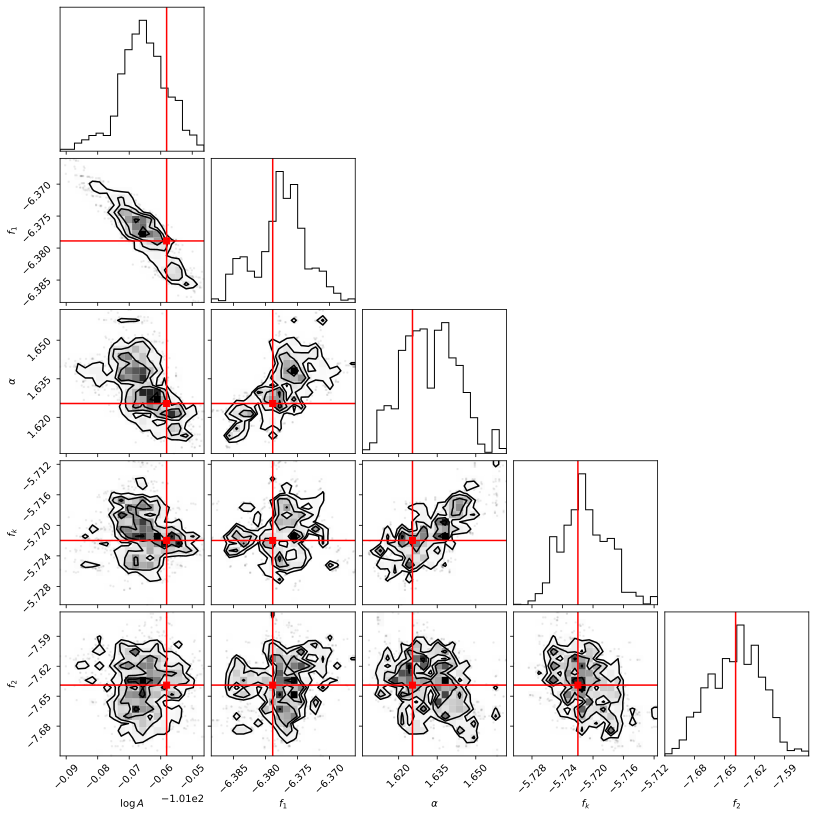

In [64]:
truths = galx[0,2:]
corner(galx_chain, labels = galx_labels, truths = truths, truth_color = 'red')
plt.show()